In [1]:
# general purpose python
import collections
import datetime
import glob
import importlib
import itertools
import json
import math
import os
import pickle
import random
import re
import shutil
import sys
import time
import warnings

# general purpose data science
import IPython
import ipywidgets as ipw
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs
import pylab
import scipy
import seaborn as sns
import sklearn
from sklearn import *
import statsmodels as sm

# computer vision
import cv2
import imageio
import PIL
from PIL import *

# deep learning
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('pytorch device:    ', device.type)

# geospatial
import rasterio as rio
import rasterio.features

ignore_warnings = True
if ignore_warnings:
    warnings.filterwarnings('ignore')
print('ignore warnings:   ', ignore_warnings)

seed = 1337
np.random.seed(seed)
torch.manual_seed(seed)
print('random seed:       ', seed)

mpl.rcParams['figure.dpi'] = 200

IPython.core.display.display(IPython.core.display.HTML("<style>.container { width:100% !important; }</style>"))

pd.options.display.max_colwidth = 32
pd.options.display.float_format = '{:,.6f}'.format
pd.options.display.expand_frame_repr = False

%matplotlib inline

sns.set(font_scale=1.3)
sns.set_style('whitegrid')
sns.set_palette(sns.color_palette('muted'))

plotly.offline.init_notebook_mode(connected=True)
plotly.io.templates.default = 'plotly_white'

_ = torch.autograd.set_detect_anomaly(True)

pytorch device:     cuda
ignore warnings:    True
random seed:        1337


### Parameters

In [2]:
# training batch size
batch_size = 2**9

# image size to resize all images to
image_size = 2**5

# number of image channels
n_channels = 3

# size of the random vector that will be used to generate samples
latent_vector_size = 2**8

# number of neurons in the dense layers
dense_layer_size = 2**8

# minimum number of conv kernels in the generator convolutions
n_generator_feature_maps = 2**4

# minimum number of conv kernels in the discriminator convolutions
n_discriminator_feature_maps = 2**4

# learning rate
learning_rate = 3e-4

# beta for the Adam optimizer
beta1 = 0.5

# how many times will we iterate through the data set for training
n_epochs = 40

# ================================================================
# techniques and parameters to make GAN training more stable
# - normalize input to [-1, 1]
# - use batch normalization
# - don't use uniform distribution to generate Z
# - maximize log(D) instead of minimizing log(1-D) for the training
# - use spherical Z
# - don't mix real and fake data in the training batches
# - avoid sparse gradients (ReLu, MaxPool, etc.)
# - use soft and noisy labels
# TODO - keep a replay buffer of past generations and occassionally show them
# TODO - keep checkpoints from the past of G and D and occassionaly swap them out for a few iterations
# - use the Adam optimizer
# - track performance during the training to catch failures early
# - don't balance loss via statistics (unless you have a good reason to)
# - if you have labels, use them
# - add noise to the inputs to D
# - add noise to each layer of G

# label softness
label_softness = 0.2

# flip labels
label_flip_probability = 0.02

# std of the noise to be added to the input of the dicriminator
discriminator_input_noise_std = 0.1

# std of the noise to be added to the generator layers
generator_noise_std_multiplier = 0.05

# probability of evaluating the models against an earlier version of the other
older_adversary_eval_probablility = 0.2

# dropout to improve stability
generator_dropout = 0.2

# dropout to improve stability
discriminator_dropout = 0.3

### Prepare the data

In [3]:
img_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(image_size),
    torchvision.transforms.CenterCrop(image_size),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.5, 0.5, 0.5),
                                     (0.5, 0.5, 0.5))])

# torchvision's own data set download does not work at the moment
celeb_dataset = torchvision.datasets.ImageFolder(root='/media/ntfs/data/celeba/',
                                                 transform=img_transform)

data_loader = torch.utils.data.DataLoader(celeb_dataset,
                                          batch_size=batch_size,
                                          shuffle=True)

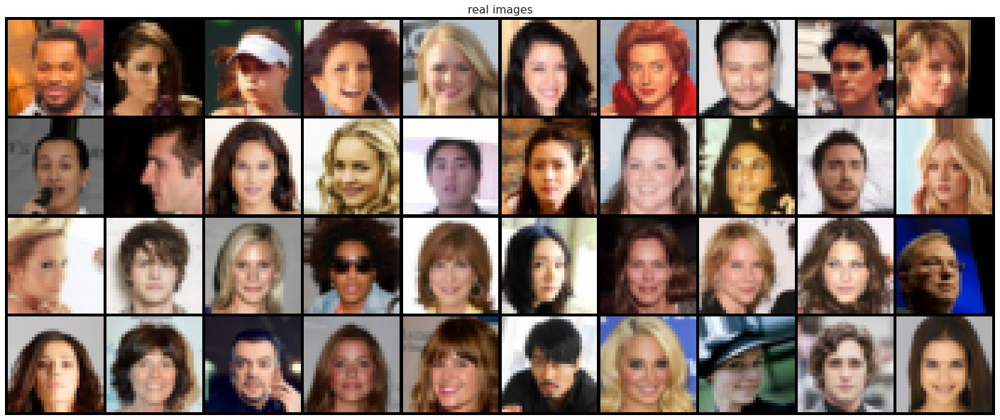

In [4]:
# take a look at some samples
batch = next(iter(data_loader))
plt.figure(figsize=(25,25))
plt.imshow(np.transpose(torchvision.utils.make_grid(batch[0][:40],
                                                    nrow=10,
                                                    padding=1,
                                                    normalize=True).cpu(),(1,2,0)))
plt.axis('off')
plt.title(f'real images')
plt.show()

### Build the models

In [5]:
# utility function used to initialize weights
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [6]:
def generate_spherical_noise(batch_size, latent_vector_size):
    noise = torch.rand(batch_size, latent_vector_size)
    return F.normalize(noise, p=2, dim=1)

generate_spherical_noise(batch_size, latent_vector_size)

tensor([[0.0051, 0.0004, 0.0388,  ..., 0.0902, 0.0048, 0.0789],
        [0.0936, 0.0333, 0.0456,  ..., 0.0398, 0.0298, 0.0226],
        [0.0190, 0.0729, 0.0826,  ..., 0.0121, 0.0629, 0.0682],
        ...,
        [0.0127, 0.0279, 0.1085,  ..., 0.0694, 0.0850, 0.0632],
        [0.0977, 0.0043, 0.0632,  ..., 0.0679, 0.0753, 0.0721],
        [0.0786, 0.0036, 0.0742,  ..., 0.0396, 0.0215, 0.0282]])

In [7]:
# mini conv transpose output size calculator
# doubles the original size
in_size = 2
kernel_size = 3
stride = 2
padding = 1
(in_size - 1) * stride - 2 * padding + kernel_size

3

In [8]:
# reshape node to unflatten input going from a dense layer to a conv transpose layer
class Reshape(nn.Module):
    def __init__(self, *args):
        super(Reshape, self).__init__()
        self.shape = args

    def forward(self, x):
        return x.view(self.shape)
    
# print the shape of the input and pass it through unchanged (debugging)
class PrintShape(nn.Module):
    def __init__(self):
        super(PrintShape, self).__init__()

    def forward(self, x):
        print(x.shape)
        return x
    
# add noise to the layers inside the network that has zero mean and a variable std
class AddNoise(nn.Module):
    def __init__(self, noise_std_multiplier):
        super(AddNoise, self).__init__()
        self.noise_std_multiplier = noise_std_multiplier

    def forward(self, x):
        #return x + torch.randn(x.shape).to(device) * torch.std(x) * self.noise_std_multiplier
        return x
        
# the generator network takes a latent vector and maps it to a fake data instance through a series of transpose convolution layers
class Generator(nn.Module):
    
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            
            nn.Linear(in_features=latent_vector_size,
                      out_features=dense_layer_size),
            nn.BatchNorm1d(num_features=dense_layer_size),
            nn.LeakyReLU(inplace=True),
            nn.Dropout(generator_dropout),
            
            Reshape(-1, dense_layer_size, 1, 1),

            nn.ConvTranspose2d(in_channels=dense_layer_size,
                               out_channels=n_generator_feature_maps * 8,
                               kernel_size=4,
                               stride=1,
                               padding=0,
                               bias=False),
            
            AddNoise(generator_noise_std_multiplier),
            nn.BatchNorm2d(num_features=n_generator_feature_maps * 8),
            nn.LeakyReLU(inplace=True),
            nn.Dropout(generator_dropout),
                        
            nn.ConvTranspose2d(in_channels=n_generator_feature_maps * 8,
                               out_channels=n_generator_feature_maps * 4,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            
            AddNoise(generator_noise_std_multiplier),
            nn.BatchNorm2d(num_features=n_generator_feature_maps * 4),
            nn.LeakyReLU(inplace=True),
            nn.Dropout(generator_dropout),
            
            nn.ConvTranspose2d(in_channels=n_generator_feature_maps * 4,
                               out_channels=n_generator_feature_maps * 2,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            
            AddNoise(generator_noise_std_multiplier),
            nn.BatchNorm2d(num_features=n_generator_feature_maps * 2),
            nn.LeakyReLU(inplace=True),
            nn.Dropout(generator_dropout),
                        
            nn.ConvTranspose2d(in_channels=n_generator_feature_maps * 2,
                               out_channels=n_channels,#n_generator_feature_maps * 1,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
                        
            nn.Tanh())

    def forward(self, z):
        return self.main(z)

# create the generator
generator = Generator().to(device)
generator.apply(weights_init)
print(generator)

# make sure that the input/output sizes are correct
z = generate_spherical_noise(batch_size, latent_vector_size).to(device)
print('input shape:  ', z.shape)
x = generator.forward(z)
print('output shape: ', x.shape)

Generator(
  (main): Sequential(
    (0): Linear(in_features=256, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01, inplace=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Reshape()
    (5): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (6): AddNoise()
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01, inplace=True)
    (9): Dropout(p=0.2, inplace=False)
    (10): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (11): AddNoise()
    (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): LeakyReLU(negative_slope=0.01, inplace=True)
    (14): Dropout(p=0.2, inplace=False)
    (15): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (16): AddNois

In [9]:
# mini conv output size calculator
# reduces size to half of the original
in_size = 100
kernel_size = 3
stride = 2
padding = 1
int((in_size + 2 * padding - kernel_size) / stride + 1)

50

In [10]:
# transformation that adds gaussian noise to a tensor
class AddNoiseTransform():
    def __init__(self, mean=0.0, std=1.0):
        self.std = std
        self.mean = mean
        
    def __call__(self, x):
        return x + (self.mean + self.std * torch.randn(x.shape).to(device))

# the discriminator network takes a data segment (fake or real) and outputs a probability of it being real
class Discriminator(nn.Module):
    
    def __init__(self):
        super(Discriminator, self).__init__()
        self.input_transform = torchvision.transforms.Compose([
            torchvision.transforms.RandomApply([AddNoiseTransform(mean=0.0,
                                                                  std=discriminator_input_noise_std)],
                                               p=0.5)
        ])
        self.main = nn.Sequential(

            nn.Conv2d(in_channels=n_channels,#n_discriminator_feature_maps * 1,
                      out_channels=n_discriminator_feature_maps * 2,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            
            nn.BatchNorm2d(num_features=n_discriminator_feature_maps * 2),
            nn.LeakyReLU(inplace=True),
            nn.Dropout(discriminator_dropout),

            nn.Conv2d(in_channels=n_discriminator_feature_maps * 2,
                      out_channels=n_discriminator_feature_maps * 4,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            
            nn.BatchNorm2d(num_features=n_discriminator_feature_maps * 4),
            nn.LeakyReLU(inplace=True),
            nn.Dropout(discriminator_dropout),
                        
            nn.Conv2d(in_channels=n_discriminator_feature_maps * 4,
                      out_channels=n_discriminator_feature_maps * 8,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            
            nn.BatchNorm2d(num_features=n_discriminator_feature_maps * 8),
            nn.LeakyReLU(inplace=True),
            nn.Dropout(discriminator_dropout),
            
            nn.Conv2d(in_channels=n_discriminator_feature_maps * 8,
                      out_channels=dense_layer_size,
                      kernel_size=4,
                      stride=1,
                      padding=0,
                      bias=False),
            nn.BatchNorm2d(num_features=dense_layer_size),
            nn.LeakyReLU(inplace=True),
            nn.Dropout(discriminator_dropout),
            
            nn.Flatten(),
            
            nn.Linear(in_features=dense_layer_size,
                      out_features=dense_layer_size),
            
            nn.BatchNorm1d(num_features=dense_layer_size),
            nn.LeakyReLU(inplace=True),
            nn.Dropout(discriminator_dropout),
            
            nn.Linear(in_features=dense_layer_size,
                      out_features=1),

            nn.Sigmoid())

    def forward(self, x):
        x_transformed = self.input_transform(x)
        return self.main(x)

# create the discriminator
discriminator = Discriminator().to(device)
discriminator.apply(weights_init)
print(discriminator)

# make sure that the input/output sizes are correct
x = torch.rand(batch_size * n_channels * image_size * image_size).view(batch_size, n_channels, image_size, image_size).to(device)
print('input shape:  ', x.shape)
y = discriminator.forward(x)
print('output shape: ', y.shape)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01, inplace=True)
    (3): Dropout(p=0.3, inplace=False)
    (4): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.01, inplace=True)
    (7): Dropout(p=0.3, inplace=False)
    (8): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.01, inplace=True)
    (11): Dropout(p=0.3, inplace=False)
    (12): Conv2d(128, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_

### Train the models

In [11]:
def generate_soft_noisy_labels(batch_size, label_softness, real_data):
    if real_data:
        labels = labels = 1 - label_softness * torch.rand(batch_size)
    else:
        labels = label_softness * torch.rand(batch_size)
    r = torch.rand(batch_size)
    for i in range(batch_size):
        if r[i] < label_flip_probability:
            labels[i] = 1 - labels[i]
    return labels

generate_soft_noisy_labels(batch_size, label_softness, True)

tensor([0.8437, 0.9743, 0.9779, 0.9388, 0.9128, 0.8460, 0.9578, 0.8252, 0.8719,
        0.8782, 0.9841, 0.9115, 0.9919, 0.9146, 0.8457, 0.9395, 0.8635, 0.8711,
        0.8487, 0.9415, 0.9878, 0.8449, 0.8598, 0.8546, 0.8997, 0.8525, 0.8953,
        0.9728, 0.8355, 0.8997, 0.8341, 0.9452, 0.8026, 0.8411, 0.8366, 0.9388,
        0.8612, 0.8710, 0.8855, 0.9379, 0.9533, 0.8551, 0.8839, 0.9043, 0.9815,
        0.9571, 0.9450, 0.8782, 0.8617, 0.9604, 0.8795, 0.9948, 0.9690, 0.9615,
        0.9021, 0.9658, 0.9838, 0.9294, 0.9643, 0.9571, 0.9447, 0.0625, 0.9211,
        0.9688, 0.9143, 0.9917, 0.8837, 0.9091, 0.9788, 0.8129, 0.9749, 0.8880,
        0.9035, 0.9080, 0.9314, 0.8302, 0.9786, 0.9519, 0.8749, 0.8711, 0.8535,
        0.9307, 0.8609, 0.8875, 0.8237, 0.8937, 0.9622, 0.8043, 0.9178, 0.9357,
        0.8598, 0.8400, 0.9754, 0.9965, 0.9478, 0.9650, 0.8231, 0.8506, 0.8036,
        0.8242, 0.9866, 0.8080, 0.9969, 0.9740, 0.8807, 0.8867, 0.9212, 0.8277,
        0.8350, 0.8262, 0.9386, 0.9848, 

In [12]:
# loss function
criterion = nn.BCELoss()

# genertor optimizer
optimizer_generator = optim.Adam(generator.parameters(),
                                 lr=learning_rate,
                                 betas=(beta1, 0.999))

# discriminator optimizer
optimizer_discriminator = optim.Adam(discriminator.parameters(),
                                     lr=learning_rate,
                                     betas=(beta1, 0.999))

loaded epoch 001 generator and discriminator from file
loaded epoch 002 generator and discriminator from file
loaded epoch 003 generator and discriminator from file
loaded epoch 004 generator and discriminator from file
loaded epoch 005 generator and discriminator from file
loaded epoch 006 generator and discriminator from file
loaded epoch 007 generator and discriminator from file
loaded epoch 008 generator and discriminator from file
loaded epoch 009 generator and discriminator from file
loaded epoch 010 generator and discriminator from file
time: 12:04:54        epoch: 011/040        batch: 00197/00396        D loss: 2.1838        G loss: 0.3615        D(x): 0.88        D(G(z)): 0.87/0.87


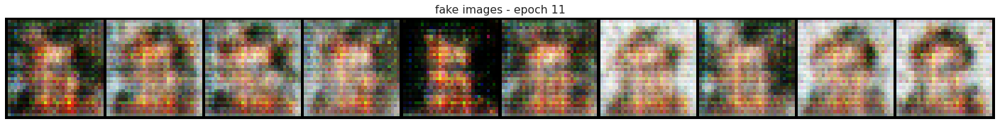

time: 12:06:52        epoch: 011/040        batch: 00395/00396        D loss: 2.2307        G loss: 0.3468        D(x): 0.88        D(G(z)): 0.87/0.87


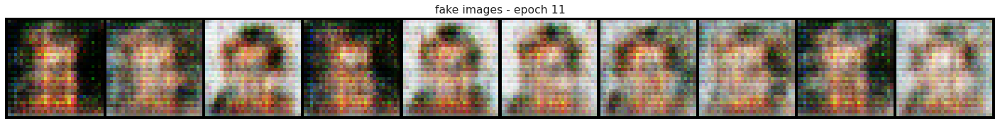

time: 12:08:49        epoch: 012/040        batch: 00197/00396        D loss: 2.2092        G loss: 0.3535        D(x): 0.88        D(G(z)): 0.87/0.87


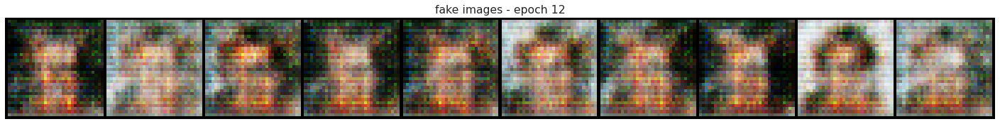

time: 12:10:46        epoch: 012/040        batch: 00395/00396        D loss: 2.1988        G loss: 0.3712        D(x): 0.88        D(G(z)): 0.87/0.87


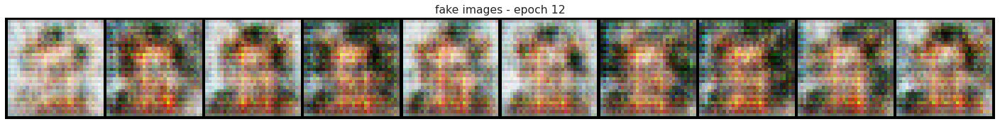

time: 12:12:44        epoch: 013/040        batch: 00197/00396        D loss: 2.2226        G loss: 0.3483        D(x): 0.88        D(G(z)): 0.88/0.88


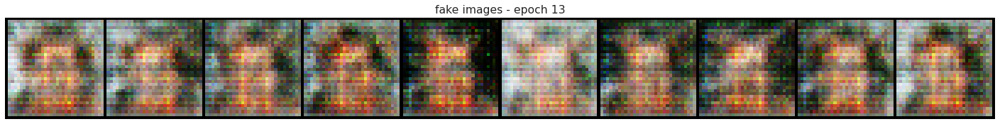

time: 12:14:41        epoch: 013/040        batch: 00395/00396        D loss: 2.2573        G loss: 0.3508        D(x): 0.88        D(G(z)): 0.88/0.88


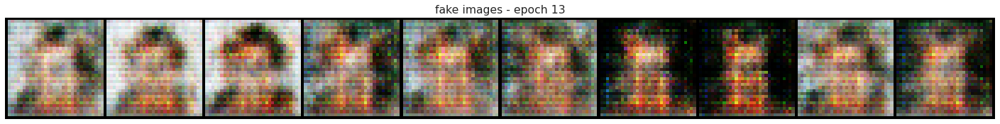

time: 12:16:39        epoch: 014/040        batch: 00197/00396        D loss: 2.1623        G loss: 0.3634        D(x): 0.88        D(G(z)): 0.87/0.88


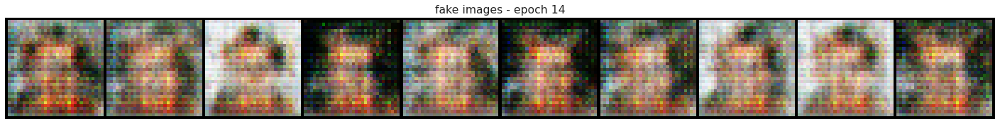

time: 12:18:37        epoch: 014/040        batch: 00395/00396        D loss: 2.2030        G loss: 0.3676        D(x): 0.88        D(G(z)): 0.87/0.87


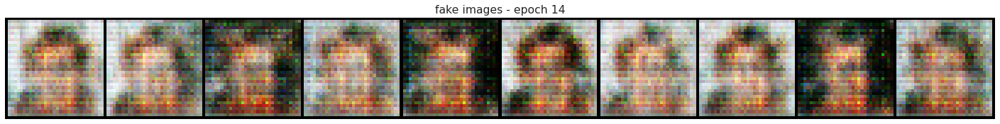

time: 12:20:34        epoch: 015/040        batch: 00197/00396        D loss: 2.1801        G loss: 0.3705        D(x): 0.88        D(G(z)): 0.87/0.88


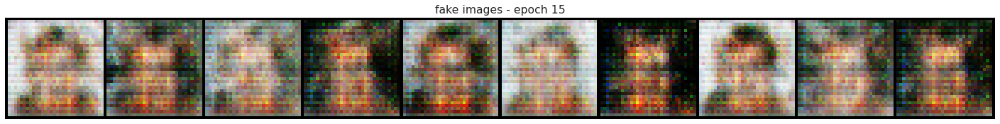

time: 12:22:32        epoch: 015/040        batch: 00395/00396        D loss: 2.2118        G loss: 0.3581        D(x): 0.88        D(G(z)): 0.87/0.87


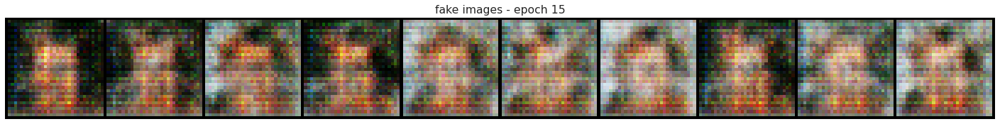

time: 12:24:30        epoch: 016/040        batch: 00197/00396        D loss: 2.2105        G loss: 0.3569        D(x): 0.88        D(G(z)): 0.87/0.88


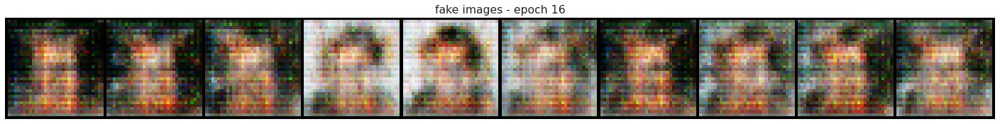

time: 12:26:28        epoch: 016/040        batch: 00395/00396        D loss: 2.2189        G loss: 0.3348        D(x): 0.88        D(G(z)): 0.87/0.87


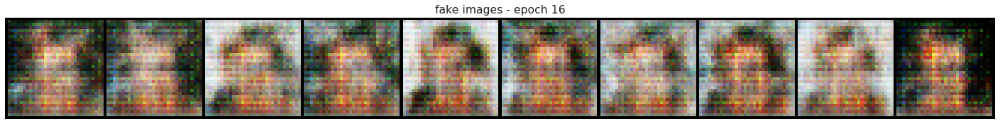

time: 12:28:26        epoch: 017/040        batch: 00197/00396        D loss: 2.2398        G loss: 0.3431        D(x): 0.88        D(G(z)): 0.87/0.88


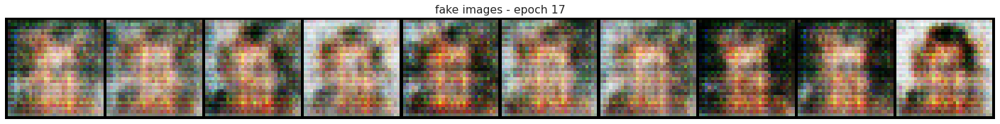

time: 12:30:24        epoch: 017/040        batch: 00395/00396        D loss: 2.2114        G loss: 0.3591        D(x): 0.88        D(G(z)): 0.87/0.87


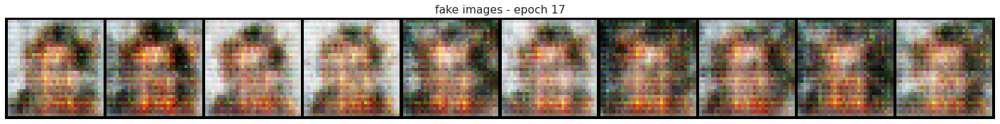

time: 12:32:23        epoch: 018/040        batch: 00197/00396        D loss: 2.1767        G loss: 0.3668        D(x): 0.88        D(G(z)): 0.87/0.87


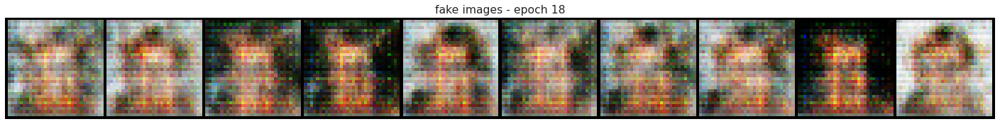

time: 12:34:21        epoch: 018/040        batch: 00395/00396        D loss: 2.1716        G loss: 0.3539        D(x): 0.88        D(G(z)): 0.87/0.87


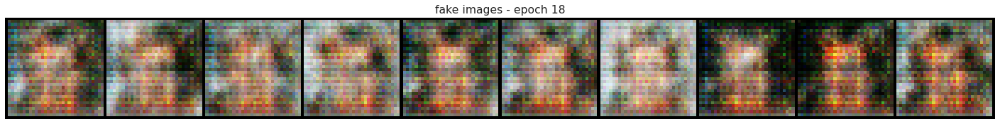

time: 12:36:19        epoch: 019/040        batch: 00197/00396        D loss: 2.2278        G loss: 0.3564        D(x): 0.88        D(G(z)): 0.87/0.87


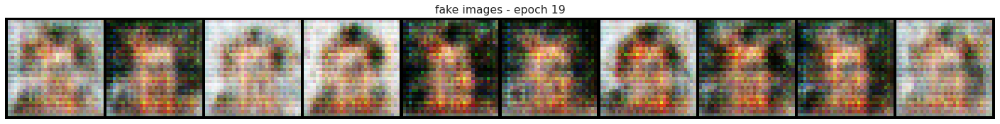

time: 12:38:16        epoch: 019/040        batch: 00395/00396        D loss: 2.1602        G loss: 0.3543        D(x): 0.88        D(G(z)): 0.87/0.87


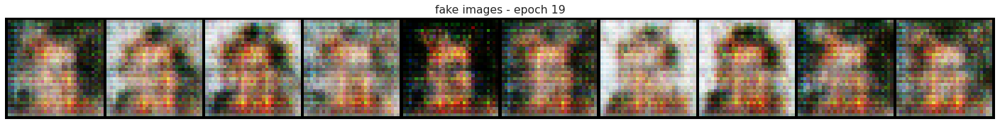

time: 12:40:15        epoch: 020/040        batch: 00197/00396        D loss: 2.1614        G loss: 0.3577        D(x): 0.88        D(G(z)): 0.87/0.87


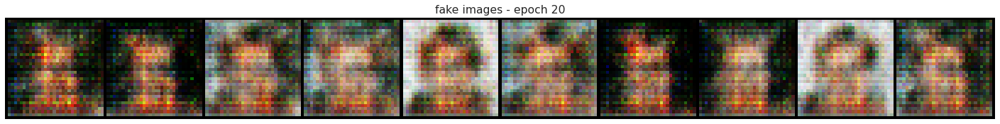

time: 12:42:14        epoch: 020/040        batch: 00395/00396        D loss: 2.2062        G loss: 0.3685        D(x): 0.88        D(G(z)): 0.87/0.87


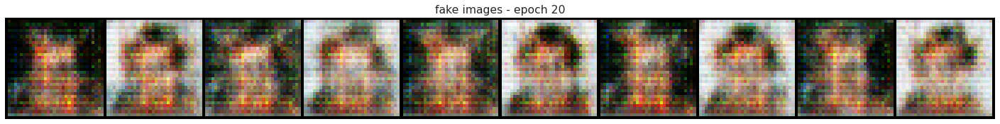

time: 12:44:11        epoch: 021/040        batch: 00197/00396        D loss: 2.2036        G loss: 0.3413        D(x): 0.88        D(G(z)): 0.87/0.87


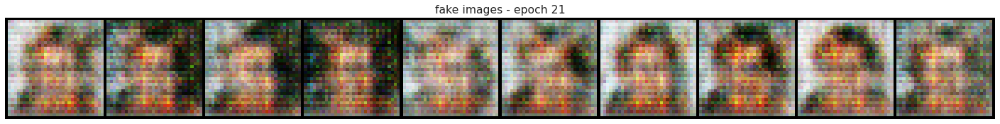

time: 12:46:09        epoch: 021/040        batch: 00395/00396        D loss: 2.1761        G loss: 0.3576        D(x): 0.88        D(G(z)): 0.87/0.87


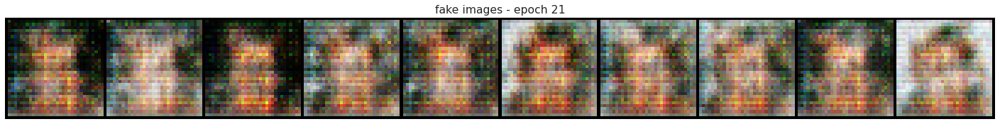

time: 12:48:07        epoch: 022/040        batch: 00197/00396        D loss: 2.2203        G loss: 0.3672        D(x): 0.88        D(G(z)): 0.87/0.87


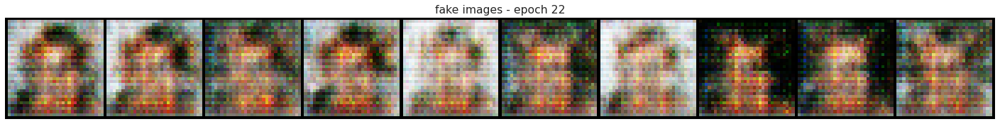

time: 12:50:05        epoch: 022/040        batch: 00395/00396        D loss: 2.2151        G loss: 0.3609        D(x): 0.88        D(G(z)): 0.87/0.87


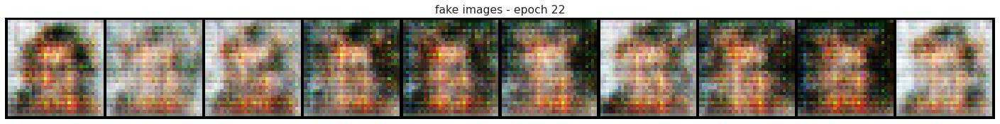

time: 12:52:02        epoch: 023/040        batch: 00197/00396        D loss: 2.1939        G loss: 0.3463        D(x): 0.88        D(G(z)): 0.87/0.87


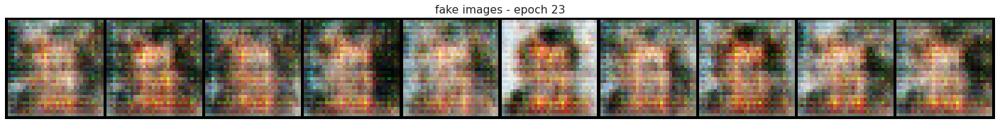

time: 12:54:00        epoch: 023/040        batch: 00395/00396        D loss: 2.1498        G loss: 0.3436        D(x): 0.88        D(G(z)): 0.87/0.87


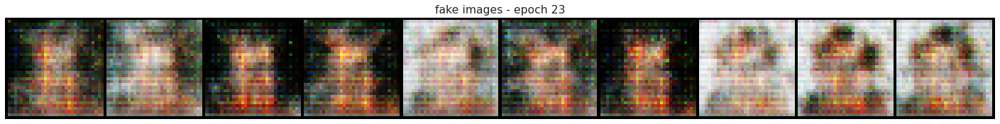

time: 12:55:58        epoch: 024/040        batch: 00197/00396        D loss: 2.1722        G loss: 0.3546        D(x): 0.88        D(G(z)): 0.87/0.87


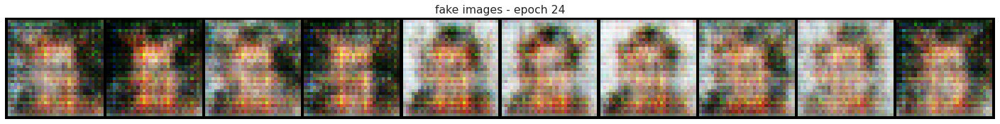

time: 12:57:56        epoch: 024/040        batch: 00395/00396        D loss: 2.2225        G loss: 0.3479        D(x): 0.88        D(G(z)): 0.87/0.88


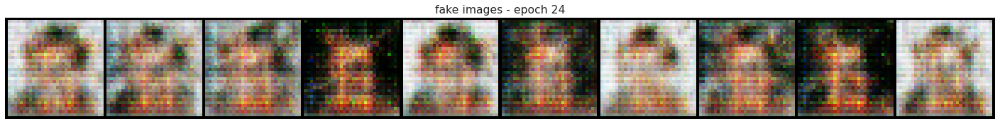

time: 12:59:55        epoch: 025/040        batch: 00197/00396        D loss: 2.2399        G loss: 0.3556        D(x): 0.88        D(G(z)): 0.87/0.87


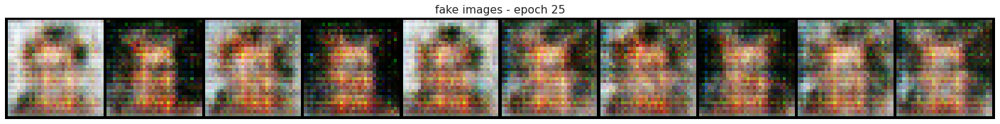

time: 13:01:53        epoch: 025/040        batch: 00395/00396        D loss: 2.2087        G loss: 0.3326        D(x): 0.88        D(G(z)): 0.87/0.88


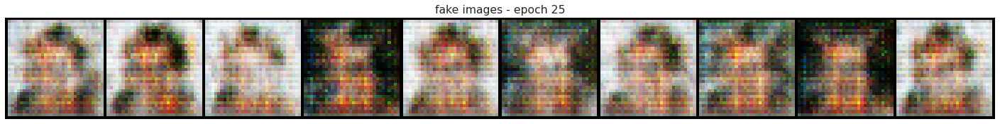

time: 13:03:51        epoch: 026/040        batch: 00197/00396        D loss: 2.1894        G loss: 0.3636        D(x): 0.88        D(G(z)): 0.87/0.87


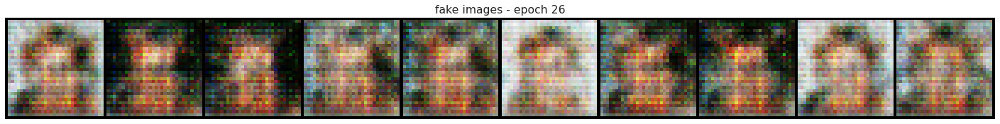

time: 13:05:49        epoch: 026/040        batch: 00395/00396        D loss: 2.2685        G loss: 0.3679        D(x): 0.87        D(G(z)): 0.88/0.88


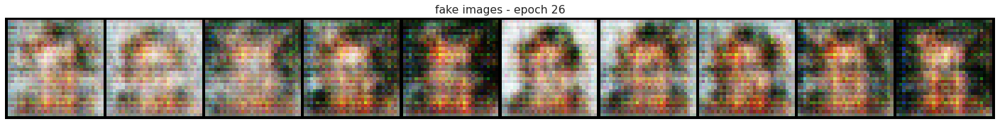

time: 13:07:47        epoch: 027/040        batch: 00197/00396        D loss: 2.1998        G loss: 0.3598        D(x): 0.88        D(G(z)): 0.87/0.88


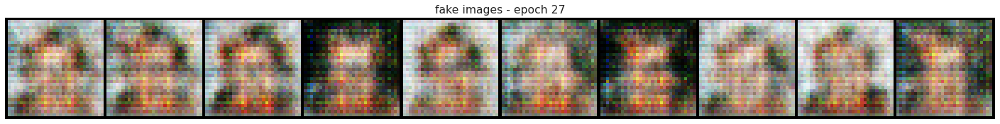

time: 13:09:45        epoch: 027/040        batch: 00395/00396        D loss: 2.1742        G loss: 0.3380        D(x): 0.88        D(G(z)): 0.87/0.88


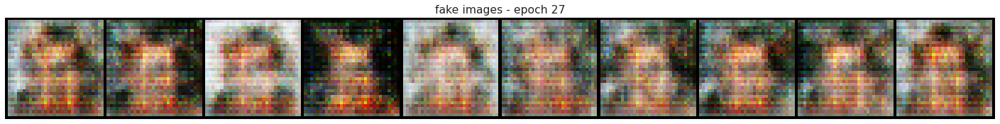

time: 13:11:43        epoch: 028/040        batch: 00197/00396        D loss: 2.2214        G loss: 0.3602        D(x): 0.88        D(G(z)): 0.87/0.88


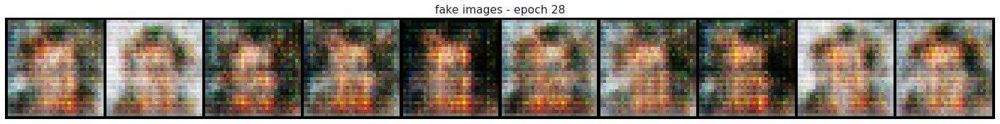

time: 13:13:41        epoch: 028/040        batch: 00395/00396        D loss: 2.2076        G loss: 0.3771        D(x): 0.88        D(G(z)): 0.87/0.87


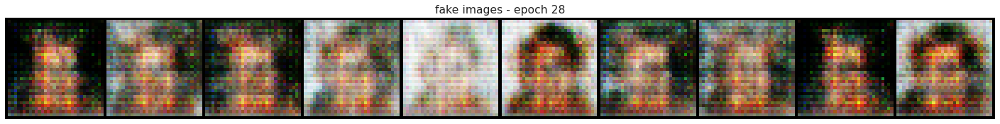

time: 13:15:39        epoch: 029/040        batch: 00197/00396        D loss: 2.2109        G loss: 0.3487        D(x): 0.88        D(G(z)): 0.87/0.87


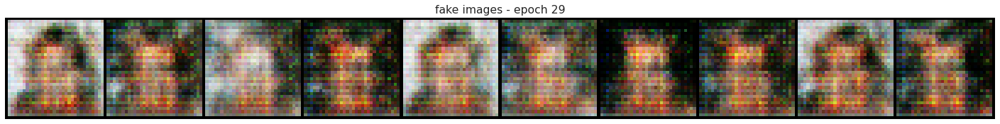

time: 13:17:37        epoch: 029/040        batch: 00395/00396        D loss: 2.2621        G loss: 0.3947        D(x): 0.88        D(G(z)): 0.88/0.88


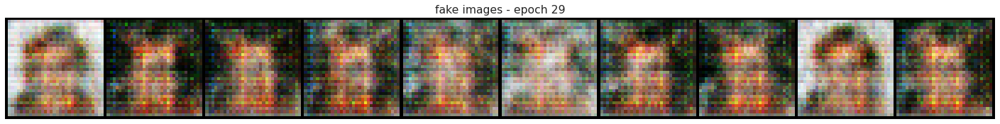

time: 13:19:35        epoch: 030/040        batch: 00197/00396        D loss: 2.2116        G loss: 0.3735        D(x): 0.88        D(G(z)): 0.87/0.87


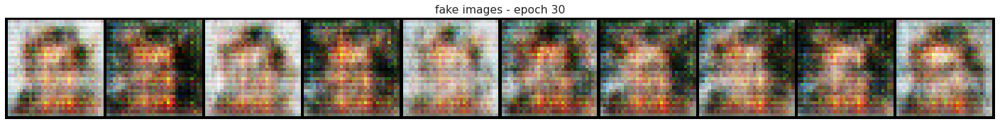

time: 13:21:34        epoch: 030/040        batch: 00395/00396        D loss: 2.2345        G loss: 0.3879        D(x): 0.88        D(G(z)): 0.88/0.88


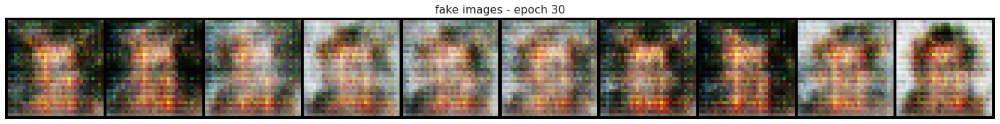

time: 13:23:32        epoch: 031/040        batch: 00197/00396        D loss: 2.2364        G loss: 0.3577        D(x): 0.88        D(G(z)): 0.87/0.87


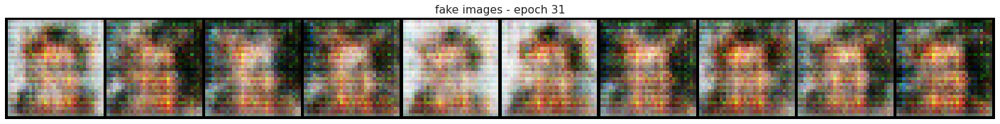

time: 13:25:31        epoch: 031/040        batch: 00395/00396        D loss: 2.2201        G loss: 0.3617        D(x): 0.88        D(G(z)): 0.87/0.87


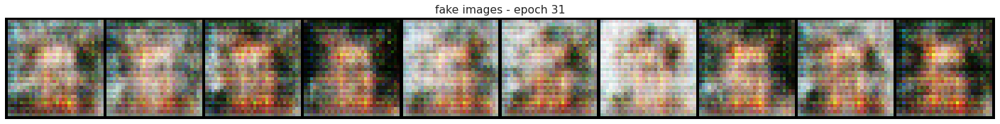

time: 13:27:28        epoch: 032/040        batch: 00197/00396        D loss: 2.2391        G loss: 0.3424        D(x): 0.88        D(G(z)): 0.87/0.87


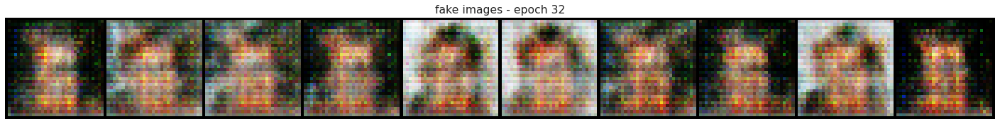

time: 13:29:26        epoch: 032/040        batch: 00395/00396        D loss: 2.1853        G loss: 0.3579        D(x): 0.88        D(G(z)): 0.87/0.87


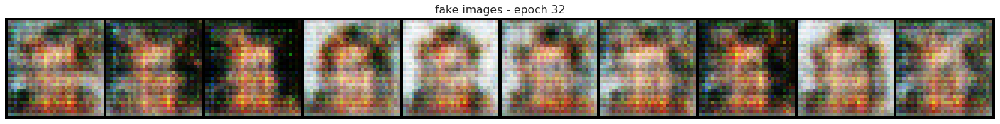

time: 13:31:24        epoch: 033/040        batch: 00197/00396        D loss: 2.2131        G loss: 0.3500        D(x): 0.88        D(G(z)): 0.87/0.87


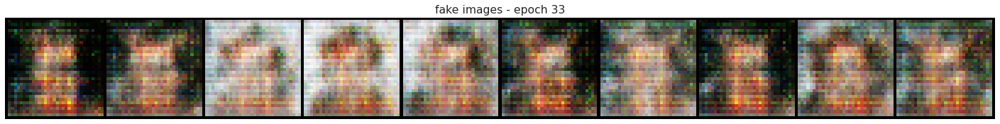

time: 13:33:22        epoch: 033/040        batch: 00395/00396        D loss: 2.2491        G loss: 0.3743        D(x): 0.88        D(G(z)): 0.88/0.88


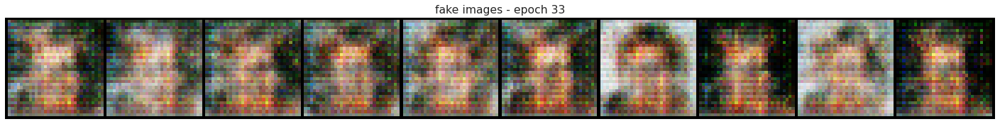

time: 13:35:21        epoch: 034/040        batch: 00197/00396        D loss: 2.2588        G loss: 0.3567        D(x): 0.88        D(G(z)): 0.88/0.88


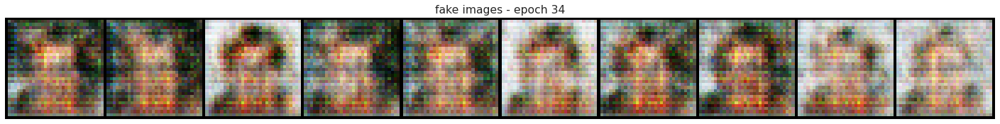

time: 13:37:19        epoch: 034/040        batch: 00395/00396        D loss: 2.2161        G loss: 0.3626        D(x): 0.88        D(G(z)): 0.87/0.87


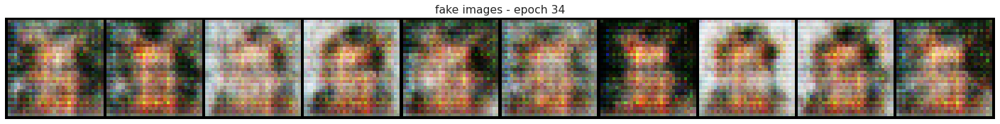

time: 13:39:18        epoch: 035/040        batch: 00197/00396        D loss: 2.1730        G loss: 0.3541        D(x): 0.88        D(G(z)): 0.87/0.87


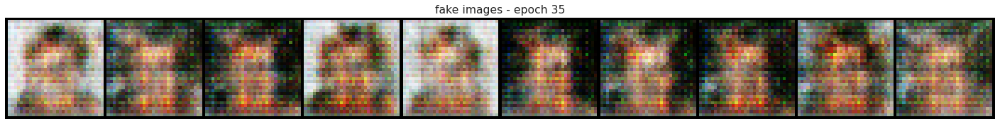

time: 13:41:16        epoch: 035/040        batch: 00395/00396        D loss: 2.2383        G loss: 0.3475        D(x): 0.88        D(G(z)): 0.87/0.88


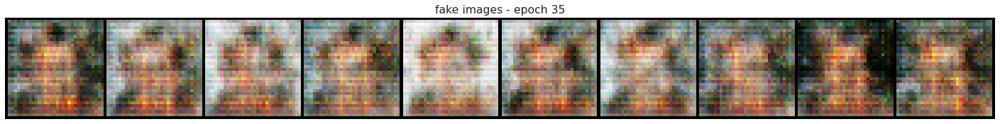

time: 13:43:15        epoch: 036/040        batch: 00197/00396        D loss: 2.2113        G loss: 0.3599        D(x): 0.88        D(G(z)): 0.87/0.87


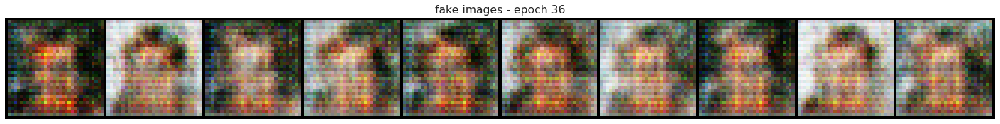

time: 13:45:13        epoch: 036/040        batch: 00395/00396        D loss: 2.1787        G loss: 0.3555        D(x): 0.88        D(G(z)): 0.87/0.87


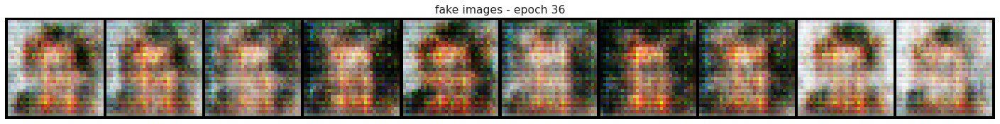

time: 13:47:11        epoch: 037/040        batch: 00197/00396        D loss: 2.2006        G loss: 0.3652        D(x): 0.88        D(G(z)): 0.87/0.87


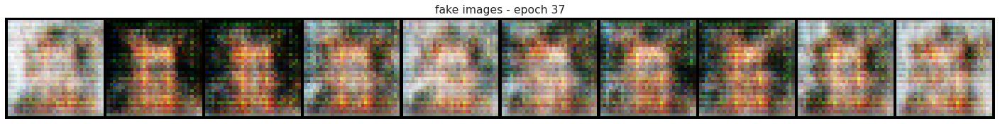

time: 13:49:09        epoch: 037/040        batch: 00395/00396        D loss: 2.2301        G loss: 0.3769        D(x): 0.88        D(G(z)): 0.87/0.88


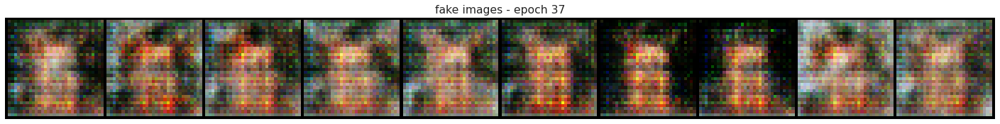

time: 13:51:08        epoch: 038/040        batch: 00197/00396        D loss: 2.1812        G loss: 0.3602        D(x): 0.88        D(G(z)): 0.87/0.87


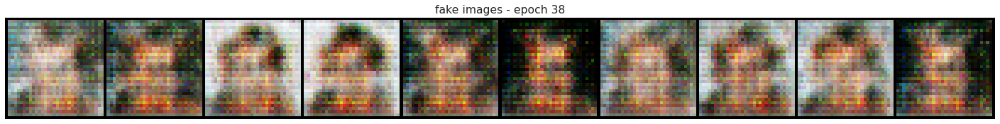

time: 13:53:06        epoch: 038/040        batch: 00395/00396        D loss: 2.2152        G loss: 0.3434        D(x): 0.87        D(G(z)): 0.87/0.87


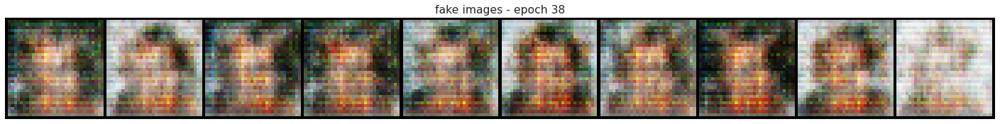

time: 13:55:04        epoch: 039/040        batch: 00197/00396        D loss: 2.2046        G loss: 0.3770        D(x): 0.88        D(G(z)): 0.87/0.87


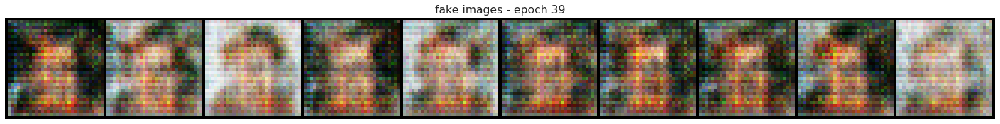

time: 13:57:03        epoch: 039/040        batch: 00395/00396        D loss: 2.2499        G loss: 0.3714        D(x): 0.88        D(G(z)): 0.88/0.87


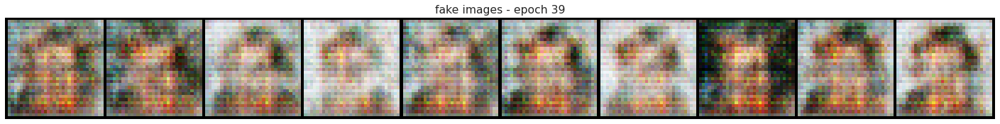

time: 13:59:00        epoch: 040/040        batch: 00197/00396        D loss: 2.2139        G loss: 0.3598        D(x): 0.88        D(G(z)): 0.87/0.87


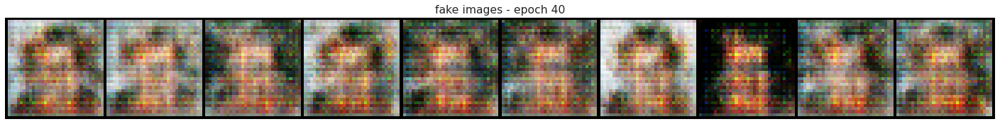

time: 14:00:58        epoch: 040/040        batch: 00395/00396        D loss: 2.1979        G loss: 0.3639        D(x): 0.88        D(G(z)): 0.87/0.87


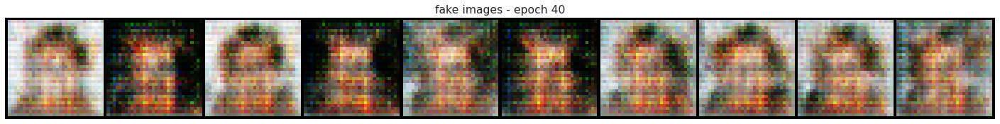

done


In [13]:
# loss history for plotting performance during training
generator_losses = []
discriminator_losses = []

# previous versions to replay them to increase stability
old_generators = {}
old_discriminators = {}

iters = 0
for epoch in range(1, n_epochs + 1):
    
    # load generator and discriminator from file if it exists to continue training
    if os.path.isfile(f'generator_epoch_{epoch:03d}.pt') and os.path.isfile(f'discriminator_epoch_{epoch:03d}.pt'):
        generator = Generator().to(device)
        generator.load_state_dict(torch.load(f'generator_epoch_{epoch:03d}.pt'))
        old_generators[epoch] = generator
        
        discriminator = Discriminator().to(device)
        discriminator.load_state_dict(torch.load(f'discriminator_epoch_{epoch:03d}.pt'))
        old_discriminators[epoch] = discriminator
        
        print(f'loaded epoch {epoch:03d} generator and discriminator from file')
        
        continue
    
    for i, data in enumerate(data_loader, 0):
        # =======================================================================
        # update discriminator network: maximize log(D(x)) + log(1 - D(G(z)))
        
        discriminator.zero_grad()

        # get a batch of real data
        # we don't use the batch_size constant here because there might not be enough data left in the loader for a full batch
        b_size = data[0].shape[0]
        real_data = data[0].view(b_size, n_channels, image_size, image_size).to(device)
        label = generate_soft_noisy_labels(batch_size=b_size,
                                           label_softness=label_softness,
                                           real_data=True).to(device)
        
        # train the discriminator with all-real batch
        output = discriminator(real_data)
        err_discriminator_real = criterion(output, label)        
        err_discriminator_real.backward()
        
        # average discriminator outputs for the real data batch
        D_x = output.mean().item()

        
        # get a batch of fake data (with some probability from an earlier generator version)
        noise = generate_spherical_noise(b_size, latent_vector_size).to(device)
        if epoch > 1 and np.random.rand() < older_adversary_eval_probablility:
            old_epoch = np.random.randint(max(1, epoch - 5), epoch)
            fake_data = old_generators[old_epoch](noise)
        else:
            fake_data = generator(noise)
        label = generate_soft_noisy_labels(batch_size=b_size,
                                           label_softness=label_softness,
                                           real_data=False).to(device)
        
        
        # train the discriminator with all-fake batch
        output = discriminator(fake_data.detach()).view(-1)
        err_discriminator_fake = criterion(output, label)
        err_discriminator_fake.backward()
        
        # average discriminator outputs for the fake data batch
        D_G_z1 = output.mean().item()
        
        # add the gradients from the all-real and all-fake batches and step the discriminator optimizer
        err_discriminator = err_discriminator_real + err_discriminator_fake
        optimizer_discriminator.step()

        # =======================================================================
        # update generator network: maximize log(D(G(z)))
        
        generator.zero_grad()
        
        # fake labels are real for generator cost
        label = generate_soft_noisy_labels(batch_size=b_size,
                                           label_softness=label_softness,
                                           real_data=True).to(device)
        
        # train the generator based on the discriminator's output (with some probability on an earlier discriminator version)
        if epoch > 1 and np.random.rand() < older_adversary_eval_probablility:
            old_epoch = np.random.randint(max(1, epoch - 5), epoch)
            output = old_discriminators[old_epoch](fake_data).view(-1)
        else:
            output = discriminator(fake_data).view(-1)
        err_generator = criterion(output, label)
        err_generator.backward()
        
        # average discriminator outputs for the fake data batch
        D_G_z2 = output.mean().item()
        
        # step the generator optimizer
        optimizer_generator.step()

        # performance logging during the training
        if i in [int(x) for x in np.linspace(0, len(data_loader) - 1, 3)[1:]]:
            print('time: {0}{10}epoch: {1:03d}/{2:03d}{10}batch: {3:05d}/{4:05d}{10}D loss: {5:0.4f}{10}G loss: {6:0.4f}{10}D(x): {7:0.2f}{10}D(G(z)): {8:0.2f}/{9:0.2f}'.format(
                datetime.datetime.now().strftime('%H:%M:%S'),
                epoch,
                n_epochs,
                i,
                len(data_loader),
                err_discriminator.item(),
                err_generator.item(),
                D_x,
                D_G_z1,
                D_G_z2,
                '        '))
            
            # save losses for plotting
            generator_losses.append(err_generator.item())
            discriminator_losses.append(err_discriminator.item())
                                            
        
            # display some fakes
            noise = generate_spherical_noise(batch_size, latent_vector_size).to(device)
            batch = generator(noise).detach()
            plt.figure(figsize=(25,15))
            plt.imshow(np.transpose(torchvision.utils.make_grid(batch[:10],
                                                                nrow=10,
                                                                padding=1,
                                                                normalize=True).cpu(),(1,2,0)))
            plt.axis('off')
            plt.title(f'fake images - epoch {epoch}')
            plt.show()
            
        iters += 1

    # save generator state and create snapshot instances for replay
    torch.save(generator.state_dict(), f'generator_epoch_{epoch:03d}.pt')
    old_generator = Generator().to(device)
    old_generator.load_state_dict(torch.load(f'generator_epoch_{epoch:03d}.pt'))
    old_generators[epoch] = old_generator
    
    # save discriminator state and create snapshot instances for replay
    torch.save(discriminator.state_dict(), f'discriminator_epoch_{epoch:03d}.pt')
    old_discriminator = Discriminator().to(device)
    old_discriminator.load_state_dict(torch.load(f'discriminator_epoch_{epoch:03d}.pt'))
    old_discriminators[epoch] = old_discriminator

print('done')

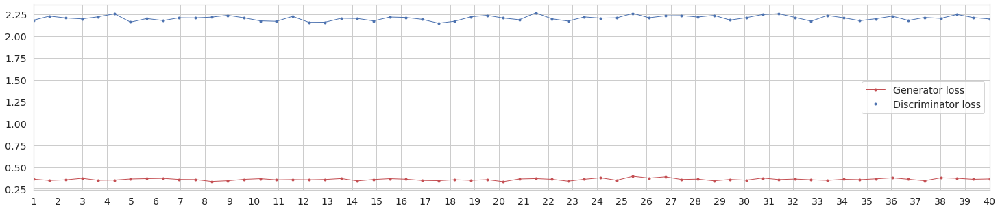

In [14]:
# plot discriminator and generator loss during training
plt.figure(figsize=(25, 5))
x_scale = np.linspace(1, n_epochs, len(generator_losses))
plt.plot(x_scale,
         generator_losses,
        c='r',
        linewidth=1,
        marker='.',
        label='Generator loss')
plt.plot(x_scale,
         discriminator_losses,
        c='b',
        linewidth=1,
        marker='.',
        label='Discriminator loss')
plt.xticks(range(1, n_epochs + 1))
plt.xlim(1, n_epochs)
plt.legend()
plt.show()

### Display results

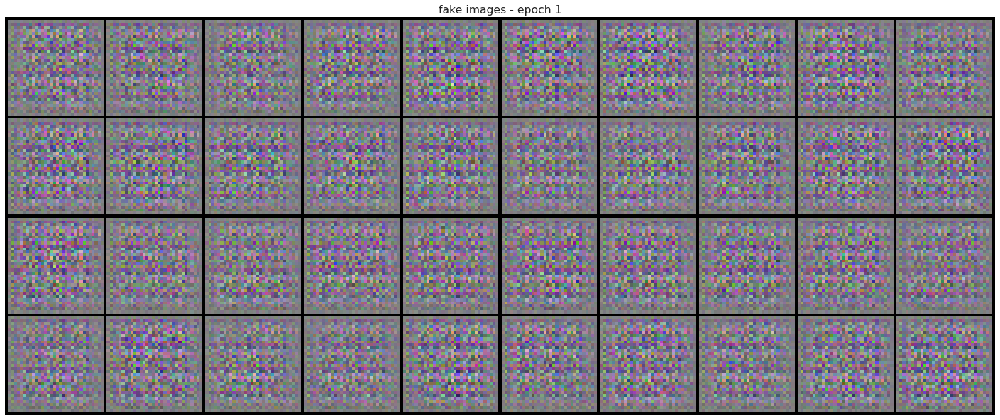

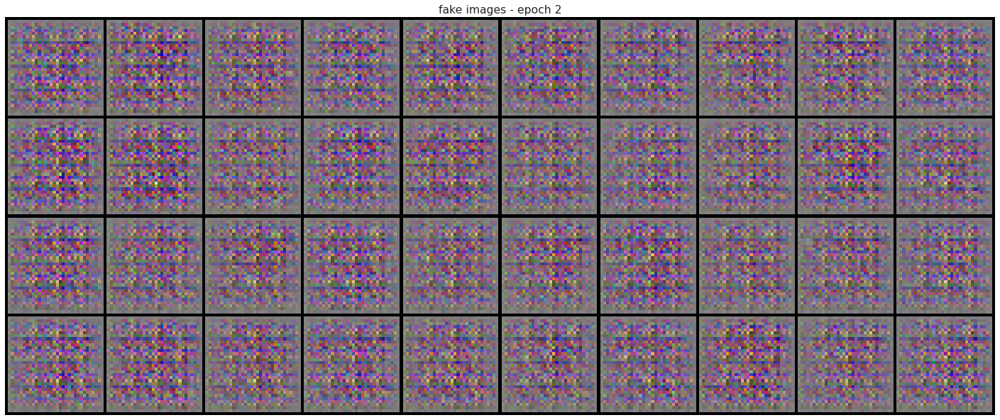

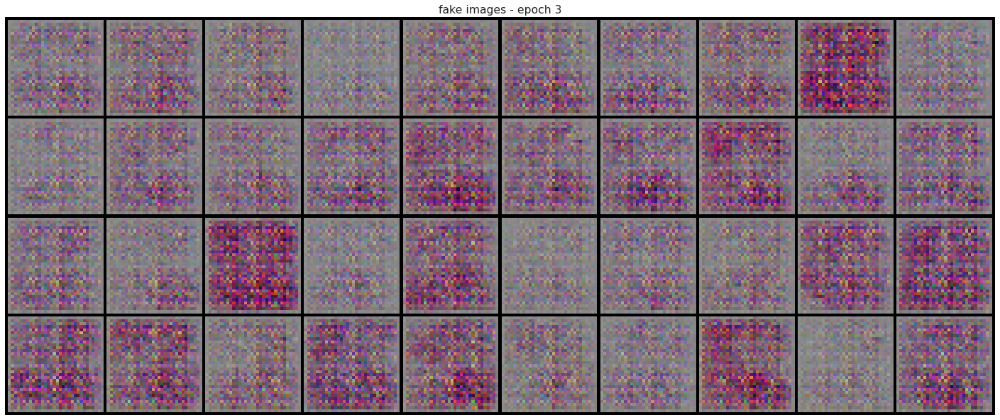

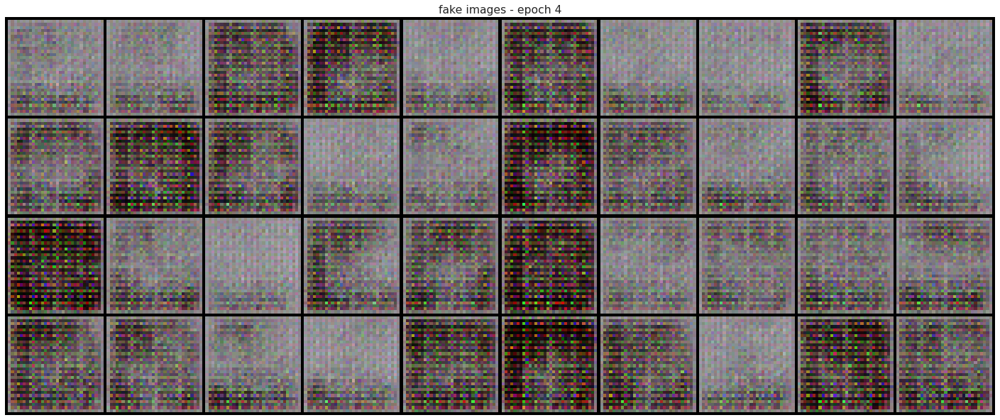

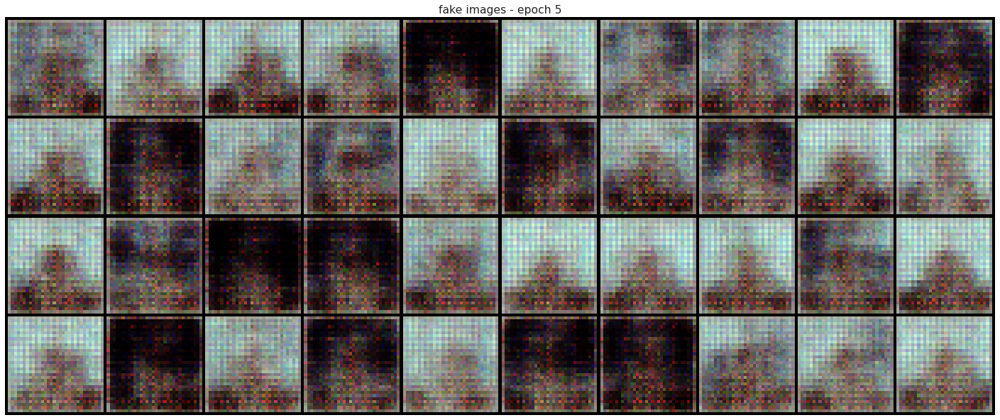

...

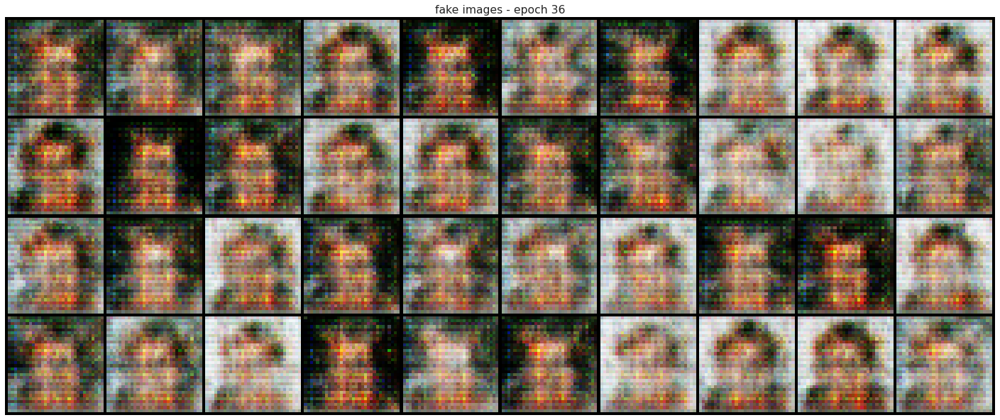

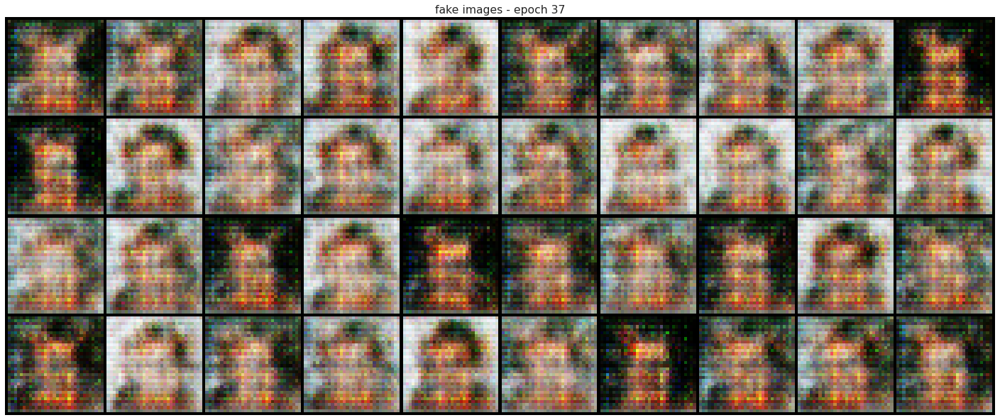

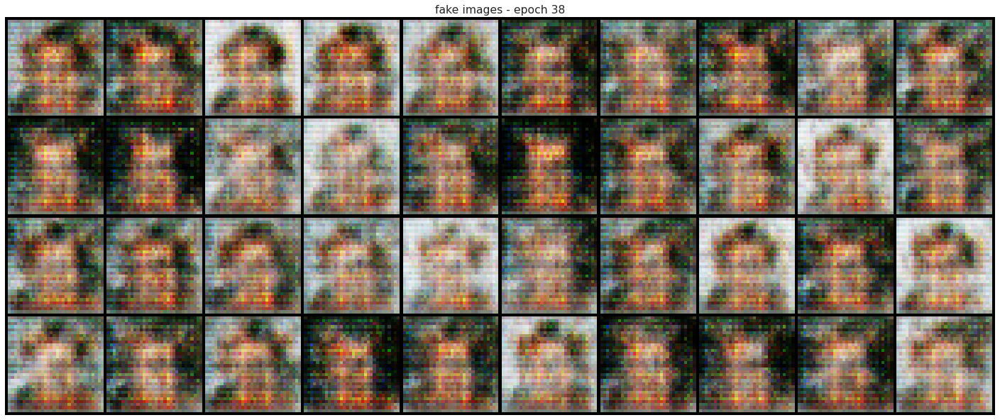

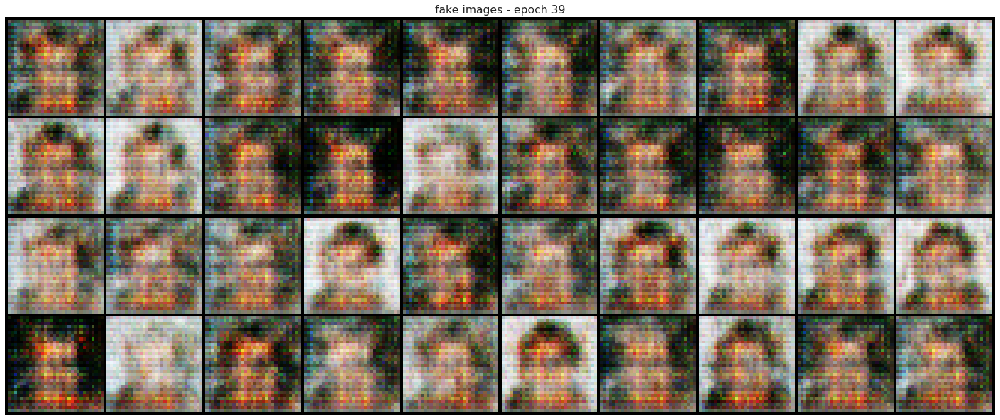

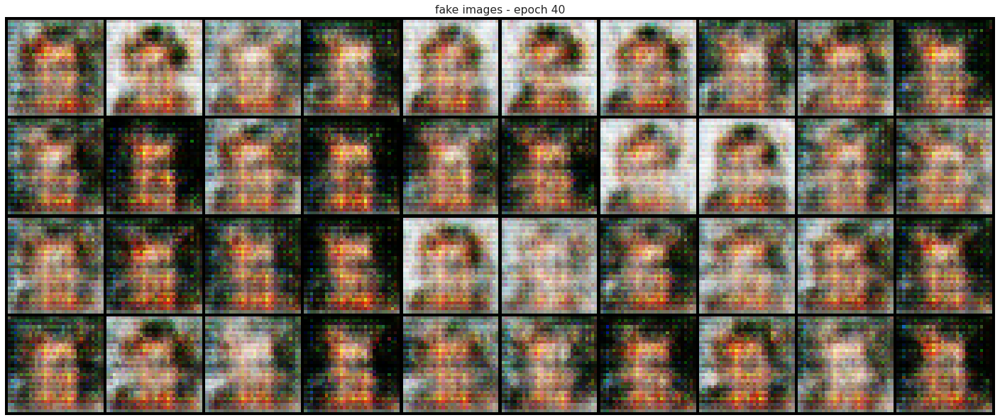

In [15]:
# take a look at some samples from each epoch
for epoch in range(1, n_epochs + 1):
    noise = torch.randn(batch_size, latent_vector_size, device=device)
    batch = old_generators[epoch](noise).detach()
    plt.figure(figsize=(25,25))
    plt.imshow(np.transpose(torchvision.utils.make_grid(batch[:40],
                                                        nrow=10,
                                                        padding=1,
                                                        normalize=True).cpu(),(1,2,0)))
    plt.axis('off')
    plt.title(f'fake images - epoch {epoch}')
    plt.show()